In [1]:
import pandas as pd
import geopandas as gpd #Used to make location data
import folium
from folium.plugins import HeatMap 
from shapely.geometry import Point #Convert longitude and Latitude to a point
import datetime as dt
import seaborn as sns

#Removes extra whitespace from a string
def remove_extra_white_space( str ):
    words = str.split()
    return " ".join(words)

In [2]:
nyc_addresses = pd.read_csv("data/nyc.csv")
nyc_property_info = pd.read_csv("data/output.csv")

In [3]:
nyc_addresses.info()
nyc_property_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 958839 entries, 0 to 958838
Data columns (total 11 columns):
LON         958839 non-null float64
LAT         958839 non-null float64
NUMBER      958839 non-null object
STREET      958839 non-null object
UNIT        21003 non-null object
CITY        0 non-null float64
DISTRICT    0 non-null float64
REGION      0 non-null float64
POSTCODE    958739 non-null float64
ID          958839 non-null float64
HASH        958839 non-null object
dtypes: float64(7), object(4)
memory usage: 80.5+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 727398 entries, 0 to 727397
Data columns (total 12 columns):
borough                   727397 non-null object
building_addr             727397 non-null object
building_class            727397 non-null object
closest_fire_station      724292 non-null object
closest_police_station    724292 non-null object
commerical_units          803 non-null float64
lot_size                  724676 non-null object
neighbor

In [4]:
#Combine building number and street and clean street column
nyc_addresses['STREET'] = nyc_addresses['STREET'].apply(remove_extra_white_space)
nyc_addresses['ADDRESS'] = nyc_addresses['NUMBER'] + " " + nyc_addresses['STREET']

In [5]:
#Make both indexes lower case so they have the same format
nyc_addresses['ADDRESS'] = nyc_addresses['ADDRESS'].str.lower()
nyc_property_info['building_addr'] = nyc_property_info['building_addr'].str.lower()

In [6]:
#Remove unnessary columns
nyc_addresses = nyc_addresses.drop(columns=['NUMBER', 'STREET', 'CITY', 'DISTRICT', 'REGION', 'ID', 'HASH'], axis=1)

In [7]:
nyc_addresses.head(3)

,LON,LAT,UNIT,POSTCODE,ADDRESS
0,-73.979408,40.756086,NaN,10036.0,560 5 ave
1,-73.994266,40.701937,NaN,11201.0,25 columbia hts
2,-73.918882,40.712779,NaN,11385.0,1903 flushing ave


In [8]:
nyc_property_info.head(3)

,borough,building_addr,building_class,closest_fire_station,closest_police_station,commerical_units,lot_size,neighborhood,residential_units,school_district,year_built,zipcode
0,Manhattan,1623 3rd ave,Special Condominium Billing Lot (R0),0.29 Miles,0.49 Miles,2.0,"153,080",Yorkville,1430.0,2.0,1975.0,10128.0
1,Manhattan,22 beaver st,Predominant Retail with Other Uses (K4),0.21 Miles,1.08 Miles,NaN,"1,314",Financial District,NaN,2.0,1920.0,10004.0
2,Manhattan,1 governors is,Military and Naval Installation (Y4),NaN,NaN,NaN,"7,736,692",Governors Island,NaN,2.0,1900.0,10004.0


In [9]:
rat_sightings = pd.read_csv("data/Rat_Sightings.csv", sep=',', error_bad_lines=False, index_col=False, dtype='unicode')

In [10]:
rat_sightings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119474 entries, 0 to 119473
Data columns (total 38 columns):
Unique Key                        119474 non-null object
Created Date                      119474 non-null object
Closed Date                       105786 non-null object
Agency                            119474 non-null object
Agency Name                       119474 non-null object
Complaint Type                    119474 non-null object
Descriptor                        119474 non-null object
Location Type                     119468 non-null object
Incident Zip                      119070 non-null object
Incident Address                  109211 non-null object
Street Name                       109210 non-null object
Cross Street 1                    97348 non-null object
Cross Street 2                    97310 non-null object
Intersection Street 1             10074 non-null object
Intersection Street 2             10074 non-null object
Address Type                      1190

In [11]:
#Remove all the entries that do not have latitude and longitude data
rat_sightings = rat_sightings.dropna(axis=1, how='all')

In [210]:
rat_sightings_count = rat_sightings.groupby(['Borough']).size().reset_index(name='Count')[0:5]

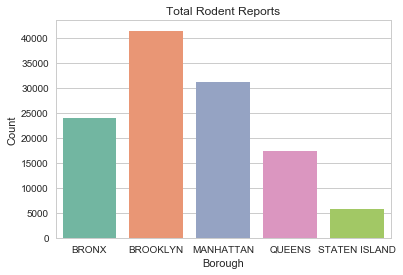

In [213]:
sns.set(style="whitegrid")
ax = sns.barplot(x='Borough',y='Count', data=rat_sightings_count,palette="Set2").set_title('Total Rodent Reports')

In [214]:
rat_sightings['Longitude'].astype(float).mean()

-73.93427602754667

In [14]:
rat_sightings['Location'] = list(zip(rat_sightings.Longitude.astype(float), rat_sightings.Latitude.astype(float)))

In [15]:
rat_sightings.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,01/01/2010 11:20:45 AM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,"(-73.80929891501533, 40.73998332248969)"
1,15633304,01/02/2010 12:50:36 AM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10016,2 AVENUE,...,01/23/2010 04:08:30 AM,06 MANHATTAN,MANHATTAN,990628,210031,Unspecified,MANHATTAN,40.74316088098852,-73.97698314758436,"(-73.97698314758436, 40.74316088098852)"
2,15633594,01/01/2010 03:05:37 PM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,"(-73.90361811283164, 40.756986581184535)"


In [16]:
rat_sightings['Location'] = rat_sightings['Location'].apply(Point)

In [17]:
geo_rat_sightings = gpd.GeoDataFrame(rat_sightings, geometry='Location')

In [18]:
#Get rid of rows that don't have longitude and latitude
geo_rat_sightings.dropna(subset=['Longitude','Latitude'], how='all', inplace=True)

In [19]:
geo_rat_sightings.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,01/01/2010 11:20:45 AM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,POINT (-73.80929891501533 40.73998332248969)
1,15633304,01/02/2010 12:50:36 AM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10016,2 AVENUE,...,01/23/2010 04:08:30 AM,06 MANHATTAN,MANHATTAN,990628,210031,Unspecified,MANHATTAN,40.74316088098852,-73.97698314758436,POINT (-73.97698314758436 40.74316088098852)
2,15633594,01/01/2010 03:05:37 PM,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,POINT (-73.90361811283164 40.75698658118453)


In [20]:
#Initial Map of NYC - Heatmap will be added to this
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap, folium only allows a certain amount of points
rat_lat = geo_rat_sightings['Latitude'].astype(float)[:30000] 
rat_lon = geo_rat_sightings['Longitude'].astype(float)[:30000]
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [21]:
#Convert a column to a datetime
geo_rat_sightings['Created Date'] = pd.to_datetime(geo_rat_sightings['Created Date'])

In [22]:
#Check the date range
geo_rat_sightings['Created Date'].describe()

count                  118633
unique                  11084
top       2017-02-15 00:00:00
freq                      177
first     2010-01-01 08:29:58
last      2018-09-16 00:33:14
Name: Created Date, dtype: object

In [23]:
geo_rat_sightings.head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,2010-01-01 11:20:45,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,POINT (-73.80929891501533 40.73998332248969)
1,15633304,2010-01-02 00:50:36,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10016,2 AVENUE,...,01/23/2010 04:08:30 AM,06 MANHATTAN,MANHATTAN,990628,210031,Unspecified,MANHATTAN,40.74316088098852,-73.97698314758436,POINT (-73.97698314758436 40.74316088098852)
2,15633594,2010-01-01 15:05:37,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,POINT (-73.90361811283164 40.75698658118453)


In [24]:
#Seperate yearly dates into a dictionary
geo_rat_sightings_dates = dict()
date_list = [2010,2011,2012,2013,2014,2015,2016,2017,2018]
for i in date_list:
    geo_rat_sightings_dates[i] = geo_rat_sightings[geo_rat_sightings['Created Date'].dt.year == i]

In [25]:
geo_rat_sightings_dates[2010].head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,2010-01-01 11:20:45,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,POINT (-73.80929891501533 40.73998332248969)
1,15633304,2010-01-02 00:50:36,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Commercial Building,10016,2 AVENUE,...,01/23/2010 04:08:30 AM,06 MANHATTAN,MANHATTAN,990628,210031,Unspecified,MANHATTAN,40.74316088098852,-73.97698314758436,POINT (-73.97698314758436 40.74316088098852)
2,15633594,2010-01-01 15:05:37,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,POINT (-73.90361811283164 40.75698658118453)


In [26]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2010]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2010]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [27]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2011]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2011]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [28]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2012]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2012]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [29]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2013]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2013]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [30]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2014]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2014]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [31]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2015]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2015]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [32]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2016]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2016]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [193]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2017]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2017]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

In [196]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
rat_lat = geo_rat_sightings_dates[2018]['Latitude'].astype(float)
rat_lon = geo_rat_sightings_dates[2018]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(rat_lat, rat_lon, [0.01 for i in rat_lat] )), radius=15, max_zoom=1)) #Adds child and displays

## Below is a gif showing the heatmaps from 2010 to 2017. I decided not to include 2018 yet because the year has not completed yet. From the heatmap, we can see an increase in rodent reports in Brooklyn, Manhattan, Bronx, and Queens.

![Rodent_heatmap_2010-2017](gifs/heatmap_rodents.gif "Rodent_heatmap_2010-2017")

In [35]:
geo_rat_sightings.groupby(['Incident Zip']).size().reset_index(name='Count').head(3)

,Incident Zip,Count
0,00083,26
1,10000,3
2,10001,464


In [36]:
geo_rat_sightings.groupby(['Incident Zip']).size().reset_index(name='Count').tail(3)

,Incident Zip,Count
193,11693,72
194,11694,78
195,11697,2


In [37]:
borough_time_series = dict()
# date_list = [2010,2011,2012,2013,2014,2015,2016,2017,2018]
for i in date_list:
    borough_time_series["QUEENS"+str(i)] = geo_rat_sightings_dates[i][geo_rat_sightings_dates[i]['Borough'] == 'QUEENS']
    borough_time_series["MANHATTAN"+str(i)] = geo_rat_sightings_dates[i][geo_rat_sightings_dates[i]['Borough'] == 'MANHATTAN']
    borough_time_series["BROOKLYN"+str(i)] = geo_rat_sightings_dates[i][geo_rat_sightings_dates[i]['Borough'] == 'BROOKLYN']
    borough_time_series["BRONX"+str(i)] = geo_rat_sightings_dates[i][geo_rat_sightings_dates[i]['Borough'] == 'BRONX']
    borough_time_series["STATEN ISLAND"+str(i)] = geo_rat_sightings_dates[i][geo_rat_sightings_dates[i]['Borough'] == 'STATEN ISLAND']

In [38]:
borough_list = ["QUEENS", "MANHATTAN", "BROOKLYN", "BRONX", "STATEN ISLAND"]

In [215]:
geo_rat_sightings_dates[2010][geo_rat_sightings_dates[2010]['Borough'] == 'QUEENS'].head(3)

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,...,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,Latitude,Longitude,Location
0,15633054,2010-01-01 11:20:45,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,1-2 Family Dwelling,11365,59-13 159 STREET,...,01/23/2010 04:08:28 AM,07 QUEENS,QUEENS,1037096,208930,Unspecified,QUEENS,40.73998332248969,-73.80929891501533,POINT (-73.80929891501533 40.73998332248969)
2,15633594,2010-01-01 15:05:37,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,3+ Family Apt. Building,11377,31-14 58 STREET,...,01/23/2010 04:08:30 AM,01 QUEENS,QUEENS,1010952,215082,Unspecified,QUEENS,40.756986581184535,-73.90361811283164,POINT (-73.90361811283164 40.75698658118453)
12,15636547,2010-01-02 09:38:29,NaN,DOHMH,Department of Health and Mental Hygiene,Rodent,Rat Sighting,Other (Explain Below),11432,NaN,...,01/24/2010 04:08:14 AM,12 QUEENS,QUEENS,1039647,195586,Unspecified,QUEENS,40.70334174980328,-73.80020318978804,POINT (-73.80020318978804 40.70334174980328)


In [40]:
crime_data = pd.read_csv("data/crime.csv", sep=',', error_bad_lines=False, index_col=False, dtype='unicode')

In [41]:
crime_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228905 entries, 0 to 228904
Data columns (total 24 columns):
CMPLNT_NUM           228905 non-null object
CMPLNT_FR_DT         228905 non-null object
CMPLNT_FR_TM         228905 non-null object
CMPLNT_TO_DT         195321 non-null object
CMPLNT_TO_TM         195450 non-null object
RPT_DT               228905 non-null object
KY_CD                228905 non-null object
OFNS_DESC            228900 non-null object
PD_CD                228757 non-null object
PD_DESC              228757 non-null object
CRM_ATPT_CPTD_CD     228905 non-null object
LAW_CAT_CD           228905 non-null object
JURIS_DESC           228905 non-null object
BORO_NM              228755 non-null object
ADDR_PCT_CD          228905 non-null object
LOC_OF_OCCUR_DESC    187313 non-null object
PREM_TYP_DESC        227918 non-null object
PARKS_NM             1694 non-null object
HADEVELOPT           11660 non-null object
X_COORD_CD           228891 non-null object
Y_COORD_CD  

In [42]:
crime_data.head(3)

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,RPT_DT,KY_CD,OFNS_DESC,PD_CD,PD_DESC,...,ADDR_PCT_CD,LOC_OF_OCCUR_DESC,PREM_TYP_DESC,PARKS_NM,HADEVELOPT,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
0,457872064,06/30/2018,23:30:00,06/30/2018,23:40:00,06/30/2018,578,HARRASSMENT 2,637,"HARASSMENT,SUBD 1,CIVILIAN",...,113,NaN,STREET,NaN,NaN,1048111,188479,40.68378593,-73.769745503,"(40.68378593, -73.769745503)"
1,271939965,06/30/2018,23:20:00,06/30/2018,23:25:00,06/30/2018,578,HARRASSMENT 2,637,"HARASSMENT,SUBD 1,CIVILIAN",...,115,INSIDE,FAST FOOD,NaN,NaN,1017940,214837,40.756298483,-73.878397328,"(40.756298483, -73.878397328)"
2,862644726,06/30/2018,23:09:00,06/30/2018,23:25:00,06/30/2018,343,OTHER OFFENSES RELATED TO THEF,478,"THEFT OF SERVICES, UNCLASSIFIE",...,94,FRONT OF,TAXI (LIVERY LICENSED),NaN,NaN,997245,204130,40.726965067,-73.953116629,"(40.726965067, -73.953116629)"


In [43]:
crime_data['Lat_Lon'] = list(zip(crime_data.Latitude.astype(float), crime_data.Longitude.astype(float)))
crime_data['Lat_Lon'] = crime_data['Lat_Lon'].apply(Point)

In [118]:
geo_crime_data = gpd.GeoDataFrame(crime_data, geometry='Lat_Lon')

In [119]:
geo_crime_data['CMPLNT_FR_DT'].describe()

count                  228883
unique                   1358
top       2018-01-01 00:00:00
freq                     1664
first     1948-02-22 00:00:00
last      2018-06-30 00:00:00
Name: CMPLNT_FR_DT, dtype: object

In [123]:
#Convert a column to a datetime
geo_crime_data['CMPLNT_FR_DT'] = pd.to_datetime(geo_crime_data['CMPLNT_FR_DT'], errors='coerce')

In [124]:
#Get rid of rows that don't have longitude and latitude
geo_crime_data.dropna(subset=['Longitude','Latitude'], how='all', inplace=True)

In [125]:
#Seperate yearly dates into a dictionary
geo_crime_data_dates = dict()
#date_list = [2010,2011,2012,2013,2014,2015,2016,2017,2018] This is already defined
for i in date_list:
    geo_crime_data_dates[i] = geo_crime_data[geo_crime_data['CMPLNT_FR_DT'].dt.year == i]

In [126]:
geo_crime_data_dates[2010].head(3)

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,RPT_DT,KY_CD,OFNS_DESC,PD_CD,PD_DESC,...,ADDR_PCT_CD,LOC_OF_OCCUR_DESC,PREM_TYP_DESC,PARKS_NM,HADEVELOPT,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
2519,162865207,2010-01-01,00:00:00,NaN,NaN,06/29/2018,116,SEX CRIMES,177,SEXUAL ABUSE,...,40,INSIDE,RESIDENCE - APT. HOUSE,NaN,NaN,1004926,234532,40.810396019,-73.925310745,POINT (40.810396019 -73.925310745)
5207,298575770,2010-09-05,09:00:00,09/30/2011,17:00:00,06/27/2018,112,THEFT-FRAUD,739,"FRAUD,UNCLASSIFIED-FELONY",...,41,INSIDE,RESIDENCE - APT. HOUSE,NaN,NaN,1013080,240805,40.827590785,-73.895828025,POINT (40.827590785 -73.895828025)
24018,943835080,2010-06-13,19:00:00,NaN,NaN,06/13/2018,351,CRIMINAL MISCHIEF & RELATED OF,258,"CRIMINAL MISCHIEF 4TH, GRAFFIT",...,68,NaN,STREET,NaN,NaN,977939,164463,40.61809534,-74.022733836,POINT (40.61809534 -74.022733836)


In [189]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2010]['Latitude'].astype(float)
crime_lon = geo_crime_data_dates[2010]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays

In [187]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2011]['Latitude'].astype(float)
crime_lon = geo_crime_data_dates[2011]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays

In [185]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2012]['Latitude'].astype(float)
crime_lon = geo_crime_data_dates[2012]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays

In [184]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2013]['Latitude'].astype(float)
crime_lon = geo_crime_data_dates[2013]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays

In [183]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2014]['Latitude'].astype(float)
crime_lon = geo_crime_data_dates[2014]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays

In [182]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2015]['Latitude'].astype(float)
crime_lon = geo_crime_data_dates[2015]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays

In [181]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2016]['Latitude'].astype(float)
crime_lon = geo_crime_data_dates[2016]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays

In [172]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2017]['Latitude'].astype(float)
crime_lon = geo_crime_data_dates[2017]['Longitude'].astype(float)
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays

In [180]:
#Clear heat map
hmap = folium.Map(location = [40.778, -73.88], zoom_start = 10)
# plot heatmap
crime_lat = geo_crime_data_dates[2018]['Latitude'].astype(float)[:20000]
crime_lon = geo_crime_data_dates[2018]['Longitude'].astype(float)[:20000]
hmap.add_child(HeatMap(list(zip(crime_lat, crime_lon, [.1/len(crime_lat) for i in crime_lat] )), radius=20, max_zoom=1, blur=25)) #Adds child and displays